In [16]:
import coordinate_conversion
import numpy as np
import sympy as sp
import scipy
import scipy.optimize
import scipy.integrate
import time
import matplotlib.pyplot as plt
from sympy.utilities.autowrap import autowrap
import matplotlib
import cvxpy as cp
from scipy.integrate import odeint
import options
from two_body_dynamics import TwoBody,TwoBodyCa
from scp import cvx_program
plt.style.use('dark_background')


opt = options.earth_to_dionysus
dynamics = TwoBodyCa()

dynamics.set_params(opt['c'])
dynamics.compile()

In [17]:
# dynamicsCa = TwoBodyCa()

# dynamicsCa.set_params(opt['c'])
# dynamicsCa.compile()

In [18]:
# x = np.random.random((6,))
# u = np.random.random((3,))
# print(dynamics.A_der_fun(*x).squeeze() - dynamicsCa.A_der_fun(x))


/home/potato/anaconda3/envs/num/lib/python3.12/site-packages/cvxpy/reductions/solvers/solving_chain.py:356: FutureWarning: 
    You specified your problem should be solved by ECOS. Starting in
    CXVPY 1.6.0, ECOS will no longer be installed by default with CVXPY.
    Please either add ECOS as an explicit install dependency to your project
    or switch to our new default solver, Clarabel, by either not specifying a
    solver argument or specifying ``solver=cp.CLARABEL``. To suppress this
    warning while continuing to use ECOS, you can filter this warning using
    Python's ``warnings`` module until you are using 1.6.0.
    
  warnings.warn(ECOS_DEP_DEPRECATION_MSG, FutureWarning)


None
60.36750809128598
2 2293.8727419673983 10.0
31.02854026692049
3 2842.1498294900816 6.666666666666667
29.040492170522064
4 2714.715882159994 6.666666666666667
9.77631576672765
5 2556.6958468161192 6.666666666666667
3.3242907740937935
6 2529.8251301755727 10.0
0.6780459792220841
7 2631.4607746137153 6.666666666666667
1.2679488308521911
8 2631.460774531925 4.444444444444445


/tmp/ipykernel_18744/1065299952.py:87: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(8,8))


1.2679487109813126
9 2631.46077446549 2.9629629629629632
1.267930945356663
10 2631.41298958917 1.9753086419753088
1.2267725847419406
11 2630.0662808891548 1.9753086419753088
0.9545773752780269
12 2694.437319013073 2.9629629629629632
0.1811298398904833
13 2708.469570263024 4.444444444444445
0.033488156106121936
14 2707.506848011948 2.9629629629629632
0.0345408073662673
15 2707.506848150541 1.9753086419753088
0.0345409395368208
16 2707.506848067291 1.316872427983539
0.034540888218395294
17 2707.5068480034206 0.877914951989026
0.03454078419982348
18 2707.506848056496 0.5852766346593506
0.03454083526235652
19 2707.506848025114 0.39018442310623375
0.03453713168345268
20 2707.4968283936564 0.26012294873748915
0.029344599394397652
21 2705.558837023166 0.3901844231062337
0.005264813068838636
22 2705.7418329129273 0.26012294873748915
0.00654843752507811
23 2705.7418327607147 0.1734152991583261
0.006547914459583082
24 2705.740295485403 0.11561019943888406
0.0057420279988691925
25 2705.8311626352

KeyboardInterrupt: 

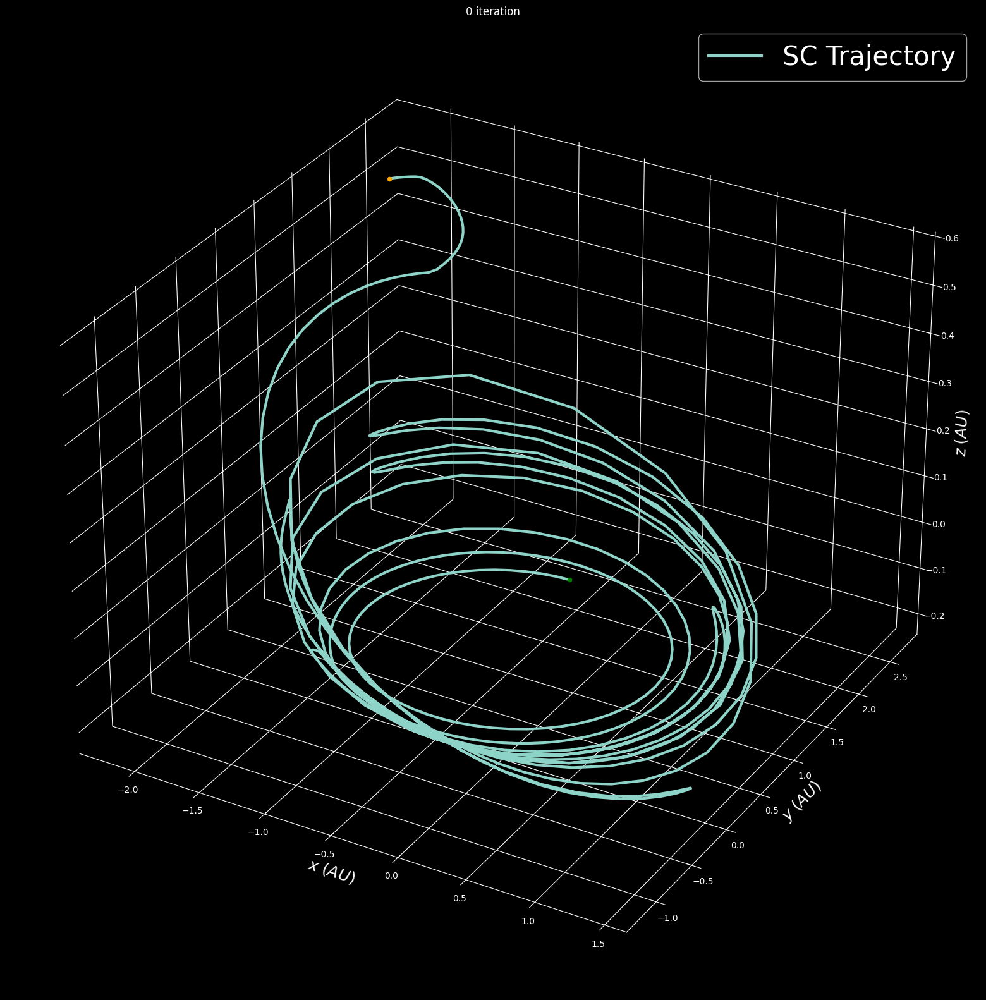

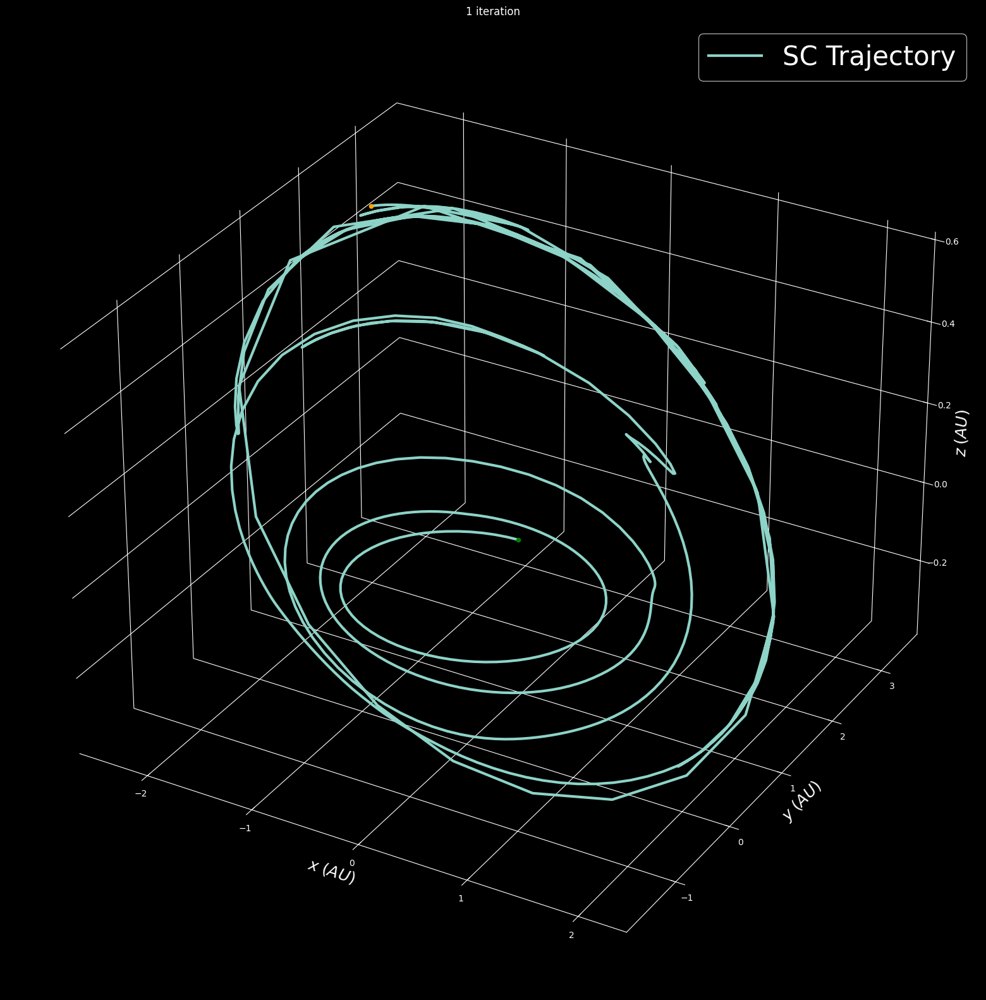

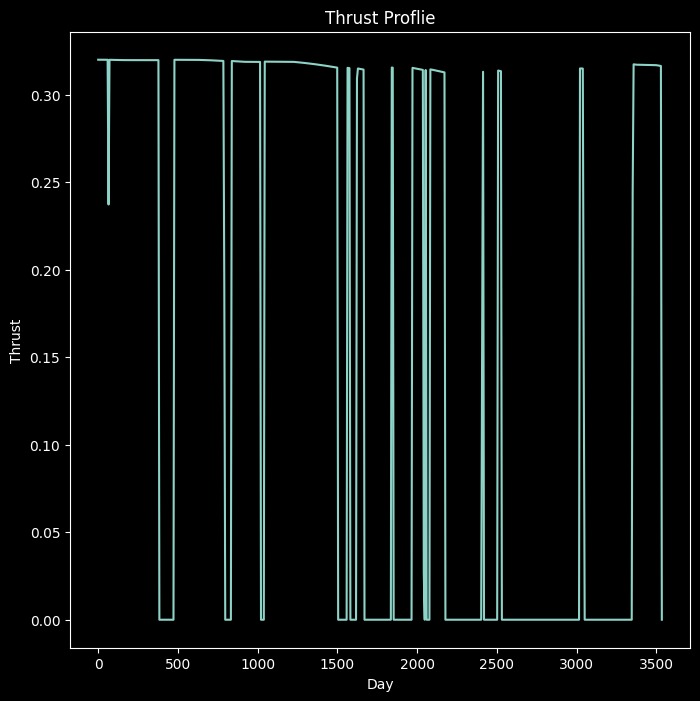

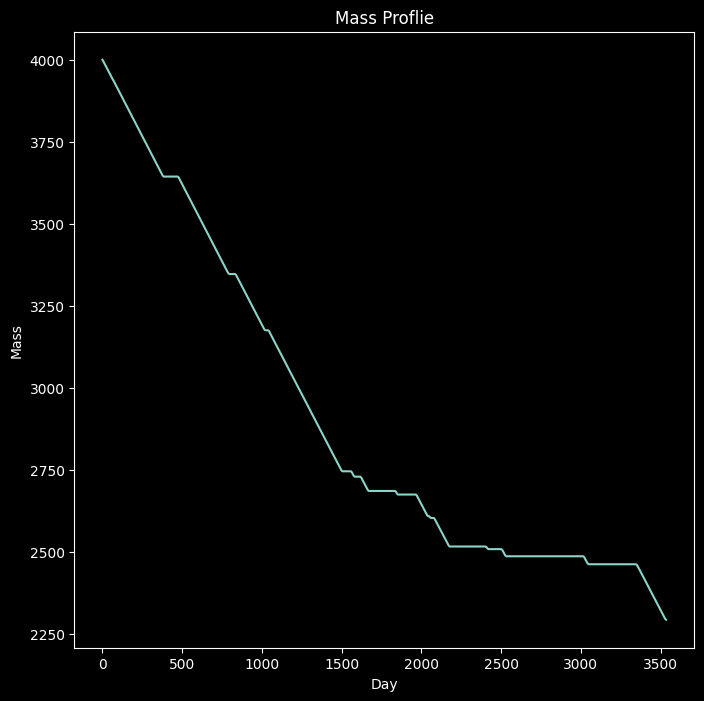

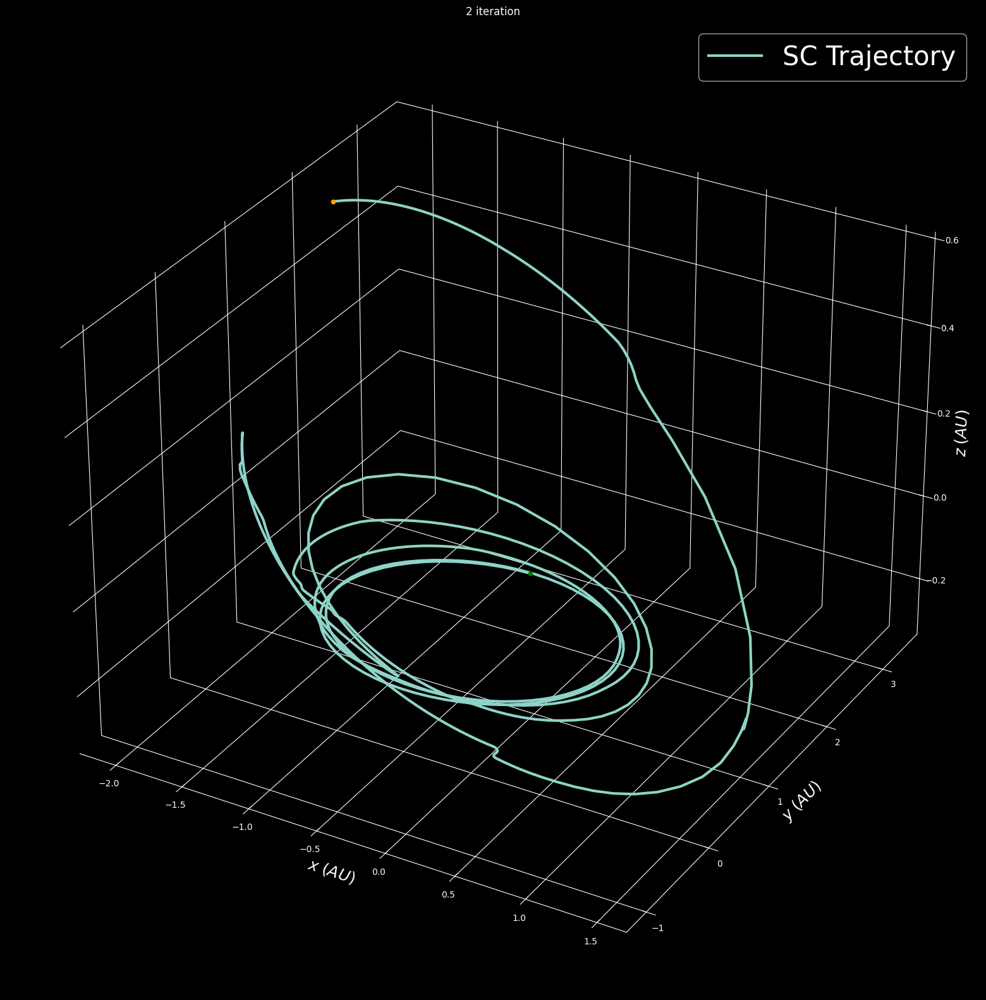

...

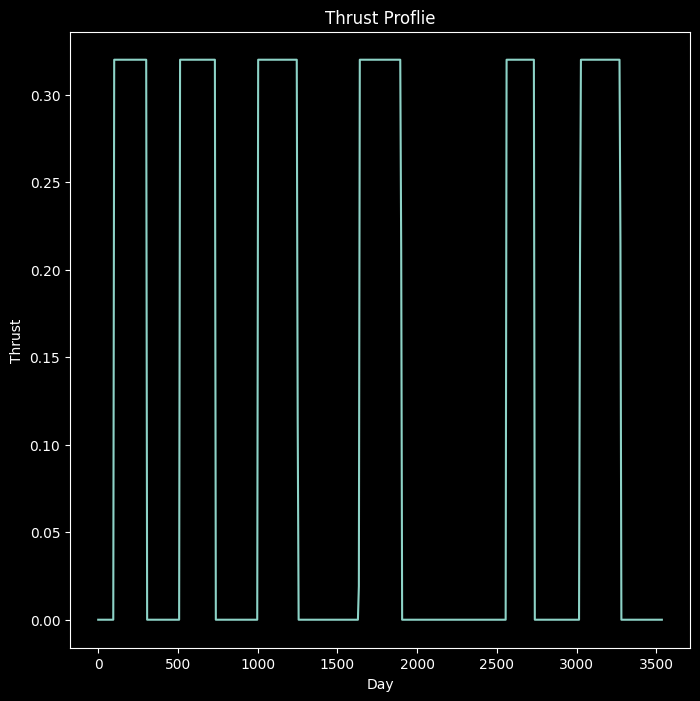

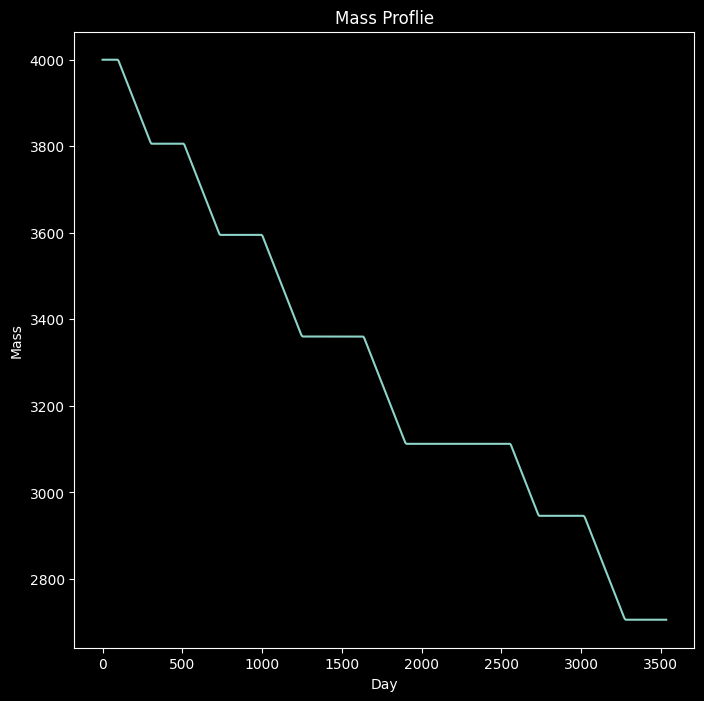

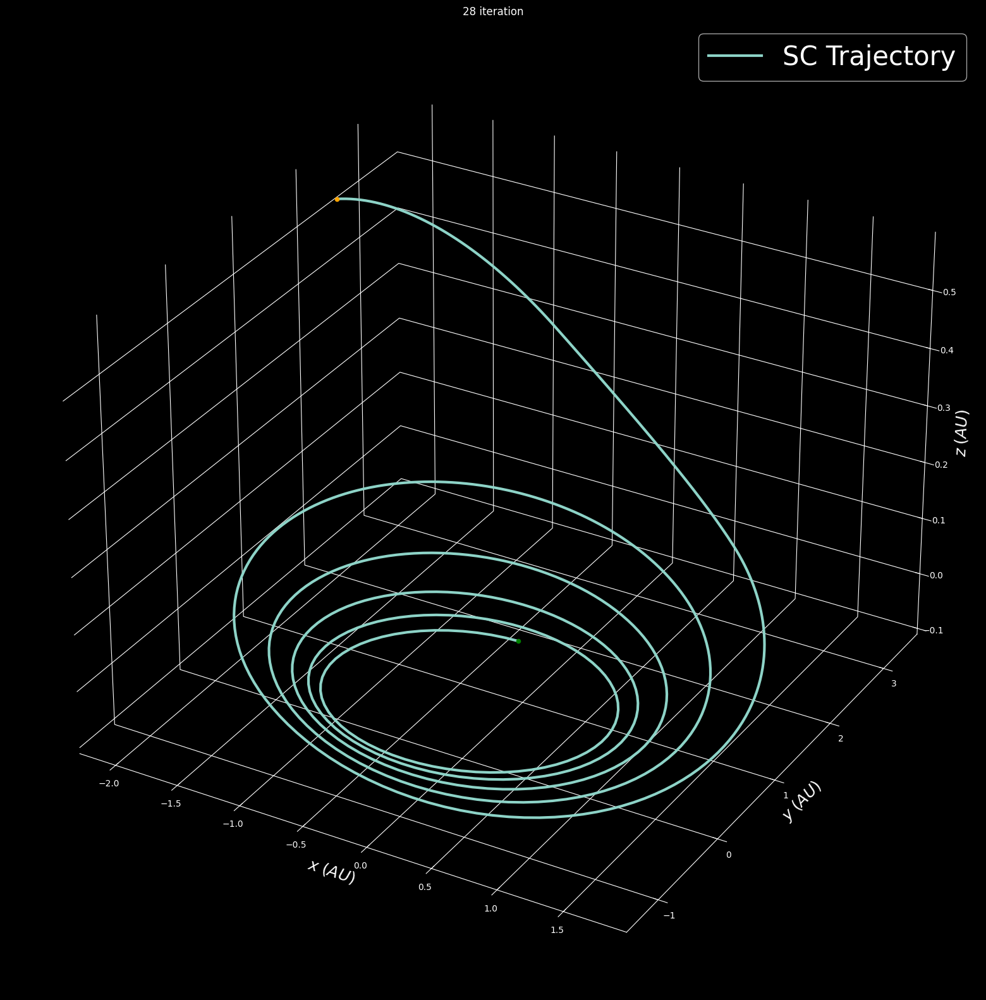

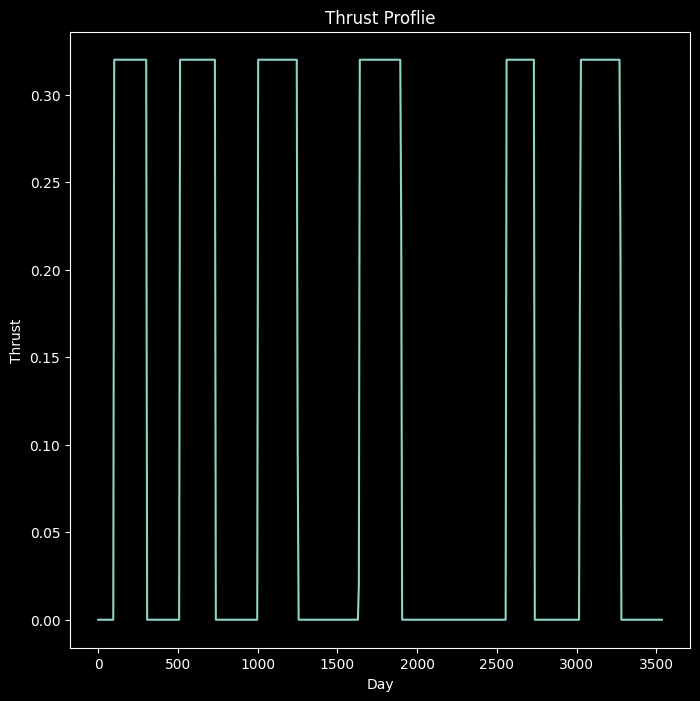

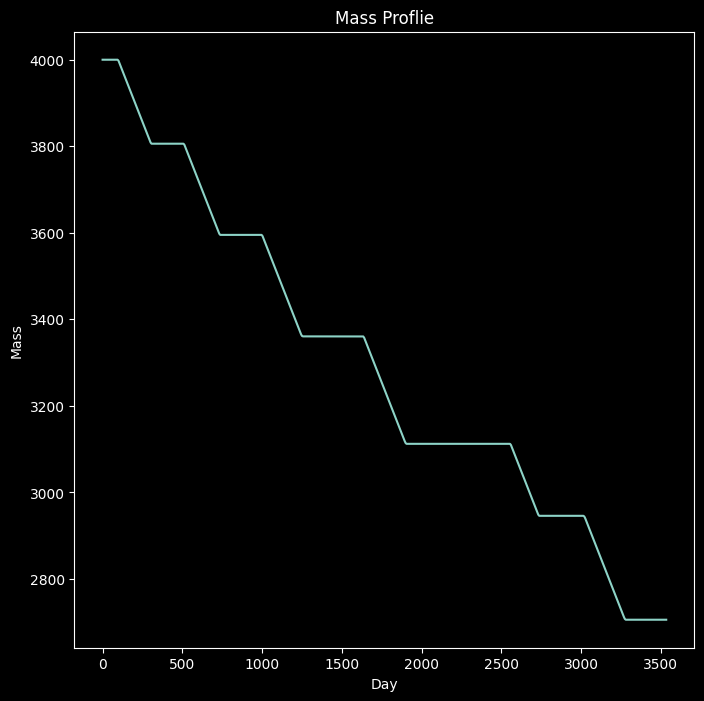

In [19]:

p = cvx_program(dynamics,opt)
converged = False
lc_his = np.zeros((10,))
nlc_his = np.zeros((10,))

tr_his = [p.trust_region]

p.optimize()
tr_his.append(p.trust_region)
nl_cost_his = [p.nonlinear_cost]
l_cost_his = [p.linear_cost]

fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111, projection='3d')

plt.title('0 iteration')


r_i = coordinate_conversion.sv_from_mee(opt['x_i'],opt['mu']) 
r_f = coordinate_conversion.sv_from_mee(opt['x_f'],opt['mu']) 

ax.scatter(r_i[0],r_i[1],r_i[2],color='green')
ax.scatter(r_f[0],r_f[1],r_f[2],color='orange')

ax.xaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))
ax.yaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))
ax.zaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))


# ax.plot(earth_trajectory['y'][0,:],earth_trajectory['y'][1,:], earth_trajectory['y'][2,:], '--g', label='Earth')
# ax.plot(mars_trajectory['y'][0,:],mars_trajectory['y'][1,:], mars_trajectory['y'][2,:], '--',color='orange', label='Mars')

traj = np.zeros((opt['init_traj'].shape[0],3))
for j in range(opt['init_traj'].shape[0]):
    traj[j] = coordinate_conversion.sv_from_mee(p.x.value[j],opt['mu'])[:3]
# alpha_converted = convert_alpha(alpha_profiles_l2[-1],converted)

ax.set_xlabel(r'$x \; (AU)$', fontsize=18)
ax.set_ylabel(r'$y \; (AU)$', fontsize=18)
ax.set_zlabel(r'$z \; (AU)$', fontsize=18)


ax.plot(traj[:,0],traj[:,1],traj[:,2],label='SC Trajectory',linewidth=3)
plt.legend( prop={'size': 30})
plt.savefig('0.png')
i = 1
while not converged:
# for i in range(0):
#     print('b'*7)

    converged,lc,nlc =p.optimize()

    tr_his.append(p.trust_region)
    nl_cost_his.append(p.nonlinear_cost)
    l_cost_his.append(p.linear_cost)
    fig = plt.figure(figsize=(20,20))
    ax = fig.add_subplot(111, projection='3d')
    plt.title(f'{i} iteration')

    ax.xaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))
    ax.yaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))
    ax.zaxis.set_pane_color((0.0, 0.0, 0.0, 0.0))


    r_i = coordinate_conversion.sv_from_mee(opt['x_i'],opt['mu'])[:3]
    r_f = coordinate_conversion.sv_from_mee(opt['x_f'],opt['mu'])[:3]

    ax.scatter(r_i[0],r_i[1],r_i[2],color='green')
    ax.scatter(r_f[0],r_f[1],r_f[2],color='orange')

    # ax.plot(earth_trajectory['y'][0,:],earth_trajectory['y'][1,:], earth_trajectory['y'][2,:], '--g', label='Earth')
    # ax.plot(mars_trajectory['y'][0,:],mars_trajectory['y'][1,:], mars_trajectory['y'][2,:], '--',color='orange', label='Mars')

    traj = np.zeros((opt['init_traj'].shape[0],3))
    for j in range(opt['init_traj'].shape[0]):
        traj[j] = coordinate_conversion.sv_from_mee(p.x.value[j],opt['mu'])[:3]
    # alpha_converted = convert_alpha(alpha_profiles_l2[-1],converted)

    ax.set_xlabel(r'$x \; (AU)$', fontsize=18)
    ax.set_ylabel(r'$y \; (AU)$', fontsize=18)
    ax.set_zlabel(r'$z \; (AU)$', fontsize=18)

    ax.plot(traj[:,0],traj[:,1],traj[:,2],label='SC Trajectory',linewidth=3)
    plt.legend( prop={'size': 30})
    plt.savefig(f'{i}.png')

    plt.figure(figsize=(8,8))
    plt.plot(np.linspace(0,opt['t_f_days'],opt['N']),p.tau_len.value*np.exp(p.z.value)/(opt['TU']**2)*opt['AUm'])
    plt.xlabel('Day')
    plt.ylabel('Thrust')
    plt.title('Thrust Proflie')
    
    plt.figure(figsize=(8,8))
    plt.plot(np.linspace(0,opt['t_f_days'],opt['N']),np.exp(p.z.value))
    plt.xlabel('Day')
    plt.ylabel('Mass')
    plt.title('Mass Proflie')
    i+=1
    print(i,np.exp(p.z.value[-1]),p.trust_region[0])

In [20]:
# plt.plot(nl_cost_his[9:])
# plt.plot(l_cost_his[9:])

In [13]:
opt['mu']

0.9985511832829159